In [3]:
from platform import python_version
python_version()

'3.10.6'

In [4]:
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict
import operator as op
from cytoolz import compose

import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs
from pyscenic.transform import df2regulons
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_binarization, plot_rss

from IPython.display import HTML, display
import loompy as lp

In [5]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 20

In [5]:
os.getcwd()

'/mnt/cho_lab/disk2/jiayuzh/projects/perianal-cd/analysis/scenic/scripts'

In [6]:
os.chdir('/mnt/cho_lab/disk2/jiayuzh/projects/perianal-cd/analysis/scenic')

Folder Structure

In [7]:
RESOURCES_FOLDERNAME = "./resources/"
AUXILLIARIES_FOLDERNAME = "./auxilliaries/"
RESULTS_FOLDERNAME = "./results/"
FIGURES_FOLDERNAME = "./figures/"

In [8]:
sc.settings.figdir = FIGURES_FOLDERNAME

Auxilliary functions.

In [9]:
BASE_URL = "http://motifcollections.aertslab.org/v10/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

In [10]:
def savesvg(fname: str, fig, folder: str=FIGURES_FOLDERNAME) -> None:
    """
    Save figure as vector-based SVG image format.
    """
    fig.tight_layout()
    fig.savefig(os.path.join(folder, fname), format='svg')

In [11]:
def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', -1)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

Auxilliary data sets.

In [12]:
# Downloaded fromm pySCENIC github repo: https://github.com/aertslab/pySCENIC/tree/master/resources
HUMAN_TFS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'allTFs_hg38.txt')
# Ranking databases. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
RANKING_DBS_FNAMES = list(map(lambda fn: os.path.join(AUXILLIARIES_FOLDERNAME, fn),
                       ['hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather',
                       'hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather']))
# Motif annotations. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
MOTIF_ANNOTATIONS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl')

read in the adata

In [13]:
adata = sc.read_h5ad('./results/PerianalCD.h5ad')
adata.uns['log1p'] = {'base': None} # have to do this each time read a h5ad file

STEP 1: Gene regulatory network inference, and generation of co-expression modules
Phase Ia: GRN inference using the GRNBoost2 algorithm

STEP 2-3: Regulon prediction aka cisTarget from CLI

In [14]:
df_motifs = load_motifs('./results/PerianalCD.motifs.csv')
df_motifs.head()

Enrichment                                  \
                                  AUC       NES MotifSimilarityQvalue   
TF    MotifID                                                           
ATF1  metacluster_111.3      0.058679  3.021264              0.000000   
ATF5  transfac_pro__M01861   0.038647  3.681475              0.000005   
BRCA1 metacluster_33.8       0.049043  3.594000              0.000000   
CEBPA tfdimers__MD00531      0.046516  3.173226              0.000004   
      metacluster_46.4       0.045476  3.006718              0.000000   

                                                \
                           OrthologousIdentity   
TF    MotifID                                    
ATF1  metacluster_111.3                    1.0   
ATF5  transfac_pro__M01861                 1.0   
BRCA1 metacluster_33.8                     1.0   
CEBPA tfdimers__MD00531                    1.0   
      metacluster_46.4                     1.0   

                                                                               \
                                                                   Annotation   
TF    MotifID                                                                   
ATF1  metacluster_111.3                            gene is directly annotated   
ATF5  transfac_pro__M01861  gene is annotated for similar motif transfac_p...   
BRCA1 metacluster_33.8                             gene is directly annotated   
CEBPA tfdimers__MD00531     gene is annotated for similar motif tfdimers__...   
      metacluster_46.4                             gene is directly annotated   

                                                                               \
                                                                      Context   
TF    MotifID                                                                   
ATF1  metacluster_111.3     (activating, weight>75.0%, hg38_10kbp_up_10kbp...   
ATF5  transfac_pro__M01861  (activating, weight>75.0%, hg38_10kbp_up_10kbp...   
BRCA1 metacluster_33.8      (activating, weight>75.0%, hg38_10kbp_up_10kbp...   
CEBPA tfdimers__MD00531     (activating, weight>75.0%, hg38_10kbp_up_10kbp...   
      metacluster_46.4      (activating, weight>75.0%, hg38_10kbp_up_10kbp...   

                                                                               \
                                                                  TargetGenes   
TF    MotifID                                                                   
ATF1  metacluster_111.3     [(MARCH7, 0.5453776361102685), (ESYT2, 1.62866...   
ATF5  transfac_pro__M01861  [(LSM10, 4.774760030831617), (SLC38A5, 6.14776...   
BRCA1 metacluster_33.8      [(PEG10, 1.4099883675811775), (LMNB1, 2.120877...   
CEBPA tfdimers__MD00531     [(LAMP1, 9.111561540778531), (SLC16A3, 2.38923...   
      metacluster_46.4      [(SNAPC1, 3.6016955888418867), (LAMP1, 9.11156...   

                                      
                           RankAtMax  
TF    MotifID                         
ATF1  metacluster_111.3         4528  
ATF5  transfac_pro__M01861       479  
BRCA1 metacluster_33.8          1790  
CEBPA tfdimers__MD00531         3630  
      metacluster_46.4           476

In [14]:
display_logos(df_motifs.head())

/tmp/ipykernel_47600/1961397235.py:20: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


STEP 4: Cellular enrichment aka AUCell
REGULON CREATION
AUCELL

In [15]:
regulons = df2regulons(df_motifs)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


OPTIONAL STEP 5 - Regulon activity binarization

don't have to run every time

In [16]:
import json
import zlib
import base64

# collect SCENIC AUCell output
lf = lp.connect( './results/PerianalCD_scenic.loom', mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
auc_mtx.to_csv('./results/PerianalCD.auc.csv')
lf.close()

In [17]:
bin_mtx, thresholds = binarize(auc_mtx)
bin_mtx.to_csv('./results/PerianalCD.bin.csv')
thresholds.to_frame().rename(columns={0:'threshold'}).to_csv('./results/PerianalCD.thresholds.csv')

run this every time

In [24]:
auc_mtx = pd.read_csv('./results/PerianalCD.auc.csv', index_col=0)
bin_mtx = pd.read_csv('./results/PerianalCD.bin.csv', index_col=0)
thresholds = pd.read_csv('./results/PerianalCD.thresholds.csv', index_col=0).threshold

In [25]:
bin_mtx['cell_type'] = adata.obs['cell_type']

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/pyscenic/plotting.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(auc_mtx[regulon_name], ax=ax, norm_hist=True, bins=bins)
/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/pyscenic/plotting.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwasko

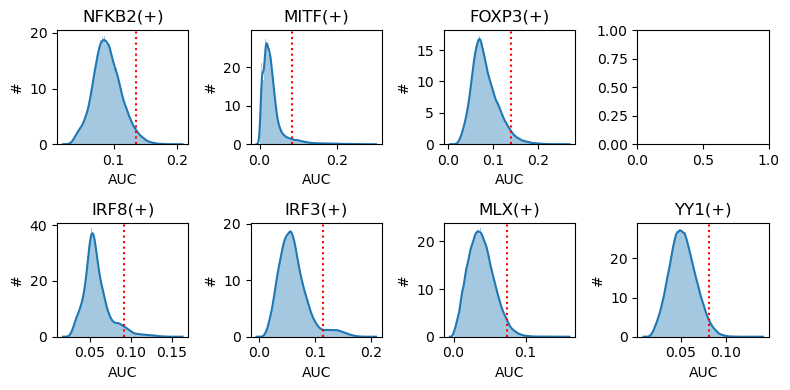

In [16]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(8, 4), dpi=100)

plot_binarization(auc_mtx, 'NFKB2(+)', thresholds['NFKB2(+)'], ax=ax1)
plot_binarization(auc_mtx, 'MITF(+)', thresholds['MITF(+)'], ax=ax2)
plot_binarization(auc_mtx, 'FOXP3(+)', thresholds['FOXP3(+)'], ax=ax3)
plot_binarization(auc_mtx, 'IRF8(+)', thresholds['IRF8(+)'], ax=ax5)
plot_binarization(auc_mtx, 'IRF3(+)', thresholds['IRF3(+)'], ax=ax6)
plot_binarization(auc_mtx, 'MLX(+)', thresholds['MLX(+)'], ax=ax7)
plot_binarization(auc_mtx, 'YY1(+)', thresholds['YY1(+)'], ax=ax8)

plt.tight_layout()
savesvg('PerianalCD_hists_binarization_thresholds.svg', fig)

In [15]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [16]:
adata.obs.cell_type = adata.obs.cell_type.astype("category")
N_COLORS = len(adata.obs.cell_type.dtype.categories)


In [19]:


COLORS = ['#0000FF', '#9966CC', '#000080', '#8B7355', '#008000', '#E9967A', '#000000', '#800000', '#541E35', '#00A86B', '#FFD700', '#008080',
          '#FF00FF', '#E6E6FA']

In [20]:
cell_type_color_lut = dict(zip(adata.obs.cell_type.dtype.categories, COLORS))
#cell_type_color_lut = dict(zip(adata.obs.cell_type.dtype.categories, adata.uns['cell_type_colors']))
cell_id2cell_type_lut = adata.obs.cell_type.to_dict()
bw_palette = sns.xkcd_palette(["white", "black"])

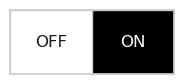

In [21]:
sns.set()
sns.set_style("whitegrid")
fig = palplot(bw_palette, ['OFF', 'ON'], ['k', 'w'])
savesvg('legend_on_off.svg', fig)

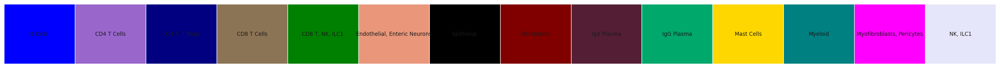

In [22]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot(sns.color_palette(COLORS), adata.obs.cell_type.dtype.categories, size=1.8)
savesvg('legend_cell_type_colors.svg', fig)

In [30]:
barcodes = adata.obs.sort_values(by = ['cell_type']).index
bin_mtx_bycelltype = bin_mtx.T[barcodes].T

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


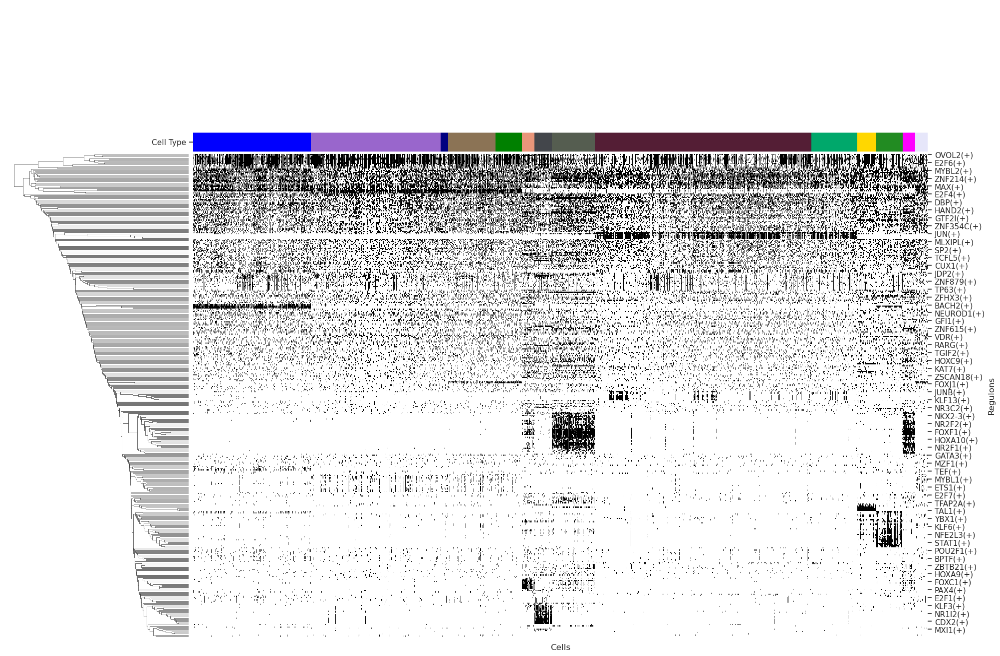

In [31]:
sns.set()
sns.set(font_scale=1.0)
sns.set_style("ticks", {"xtick.minor.size": 1, "ytick.minor.size": 0.1})
g = sns.clustermap(bin_mtx_bycelltype.T, 
               col_colors=bin_mtx_bycelltype.index.map(cell_id2cell_type_lut).map(cell_type_color_lut),
               cmap=bw_palette, figsize=(20,20),col_cluster = False)
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xlabel('Cells')
g.ax_heatmap.set_ylabel('Regulons')
g.ax_col_colors.set_yticks([0.5])
g.ax_col_colors.set_yticklabels(['Cell Type'])
g.cax.set_visible(False)
g.fig.savefig(os.path.join(FIGURES_FOLDERNAME, 'PerianalCD_bin-auc-score_heatmap.png'), format='png')

STEP 6: Non-linear projection and clustering
In this step a scanpy.AnnData object is created containing all metadata and results.

First, we select and retain only the most variable genes in the dataset.

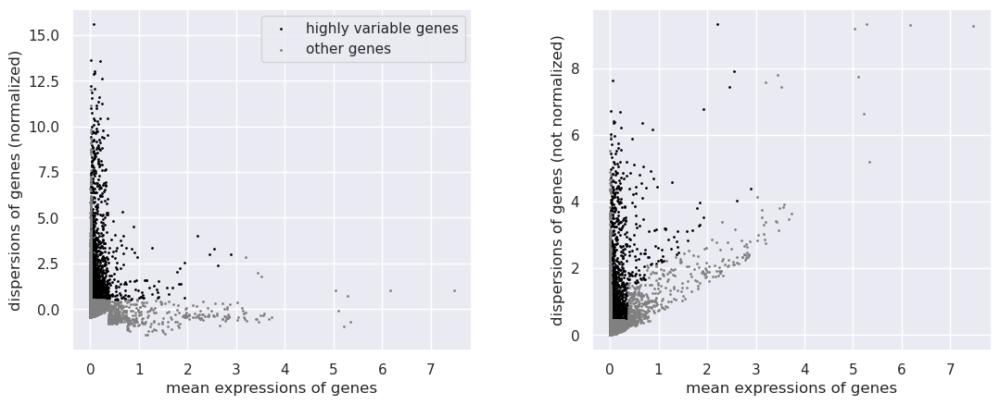

In [32]:
sns.set()
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]

Then we apply a linear-dimensional reduction technique (PCA).

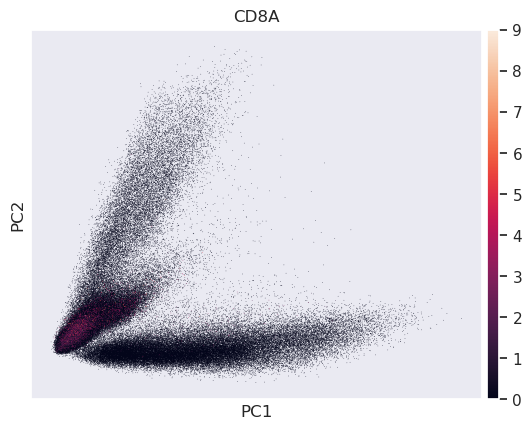

In [33]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='CD8A')

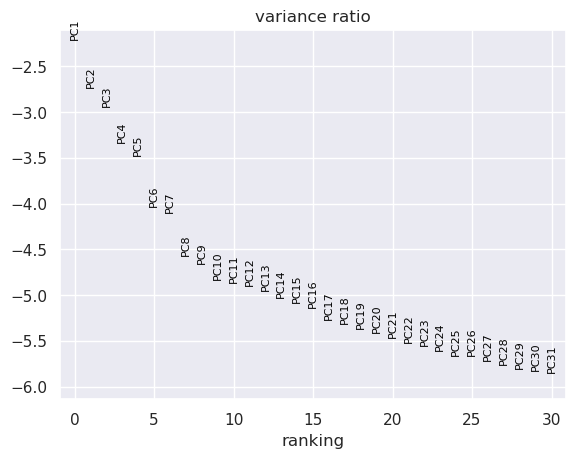

In [34]:
sc.pl.pca_variance_ratio(adata, log=True)

Followed by a tSNE projection.

In [35]:
sc.tl.tsne(adata)

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


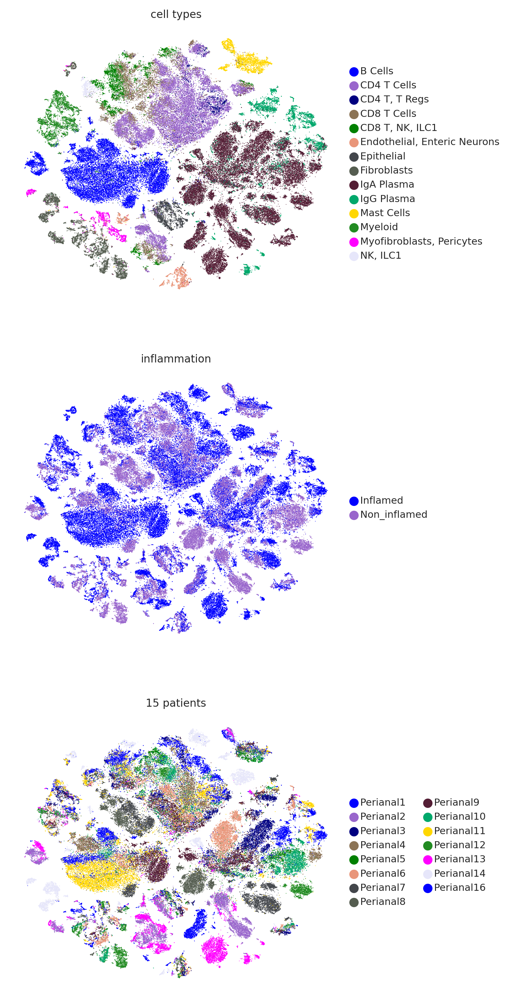

In [36]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'inflammation', 'patient_id'], 
           title=['cell types', 'inflammation',
                 '{} patients'.format(len(adata.obs.patient_id.unique()))], ncols=1, palette=COLORS,
          save='PerianalCD_PCA+tSNE.svg')

We capture the non-linear projection based on PCA+tSNE for later storage in the loom file.

In [37]:
embedding_pca_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

We add all metadata derived from SCENIC to the scanpy.AnnData object.

In [38]:
add_scenic_metadata(adata, auc_mtx, regulons)
adata.write_h5ad('./results/PerianalCD.h5ad')

AUCELL + tSNE PROJECTION
We change the tSNE projection so that it relies on AUCell instead of PCA.

In [23]:
sc.tl.tsne(adata, use_rep='X_aucell')

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


In [24]:
embedding_aucell_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


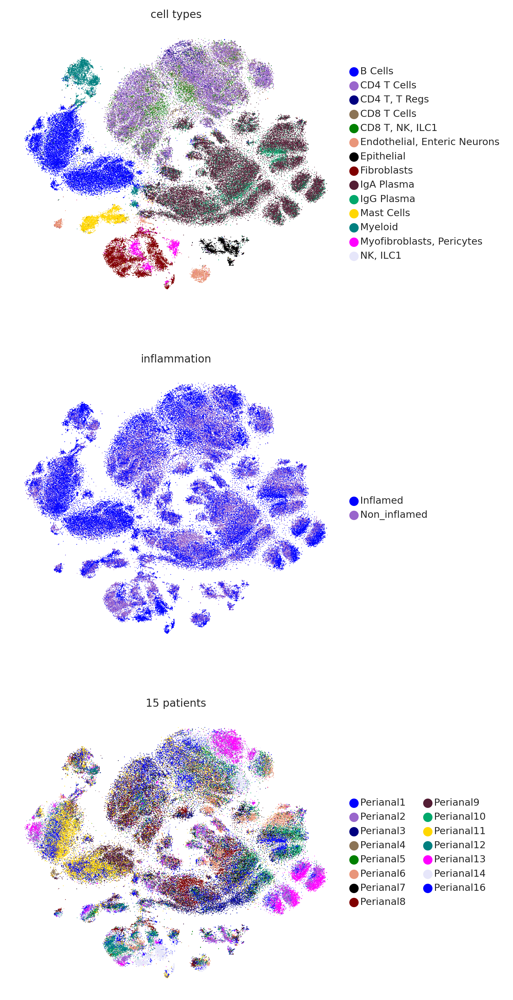

In [25]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'inflammation', 'patient_id'], 
           title=['cell types', 'inflammation',
                 '{} patients'.format(len(adata.obs.patient_id.unique()))], ncols=1, palette=COLORS,
          save='PerianalCD_AUCell+tSNE.svg')

CELL TYPE SPECIFIC REGULATORS - Z-SCORE

To find cell type specific regulators we use a Z score (i.e. the average AUCell score for the cells of a give type are standardized using the overall average AUCell scores and its standard deviation).

In [13]:
df_obs = adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['cell_type']]
df_results = ((df_scores.groupby(by='cell_type').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 3.0)].sort_values('Z', ascending=False).head()

,cell_type,regulon,Z
4589,Mast Cells,TAL1(+),5.301596
2662,Epithelial,GATA6(+),5.209479
4368,Mast Cells,GATA2(+),5.167018
2685,Epithelial,HNF4A(+),5.102070
2466,"Endothelial, Enteric Neurons",TEAD4(+),5.072158


In [14]:
df_results.sort_values('Z', ascending=False).to_csv('./results/PerianalCD_regulons_z-scores.csv')
df_sig = df_results[df_results.Z >= 1.8].sort_values('Z', ascending=False)

In [26]:
bin_mtx = bin_mtx.groupby(by='cell_type').mean().T

In [19]:
regulon_names = np.unique(df_sig.regulon)

In [27]:
bin_mtx = bin_mtx.stack().reset_index().rename(columns={'level_0': 'regulon', 0:'presence'})


In [ ]:

bin_mtx = bin_mtx[bin_mtx.regulon.isin(regulon_names)] # locate the overlapps

In [22]:
merged_df = pd.merge(df_sig, bin_mtx, on=['cell_type', 'regulon'], how='left') 
#merged_df = merged_df.drop('Unnamed: 0', axis=1) # clean up
merged_df = merged_df.loc[merged_df.presence > 0.2]
merged_df.to_csv('results/PerianalCD_sig_regulons_z-score_presence.csv', index = False) # write output

In [46]:
np.savetxt('./results/regulon_names.txt', regulon_names,  fmt='%s')

/tmp/ipykernel_11447/1481274415.py:5: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


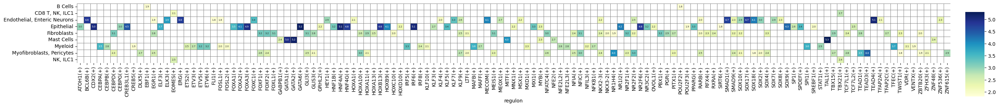

In [48]:
df_heatmap = pd.pivot_table(data=df_results[df_results.Z >= 1.8].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
#df_heatmap.drop(index='Myocyte', inplace=True) # We leave out Myocyte because many TFs are highly enriched (becuase of small number of cells).
fig, ax1 = plt.subplots(1, 1, figsize=(27, 12))
cbar_ax = fig.add_axes([1.01, .35, .02, 0.2])
sns.heatmap(df_heatmap, ax=ax1, annot=True, fmt=".1f", linewidths=.7, cbar=True, square=True, linecolor='gray', 
            cmap="YlGnBu", annot_kws={"size": 5}, cbar_ax=cbar_ax)
ax1.set_ylabel('')

savesvg('PerianalCD_sig_regulons_heatmap.svg', fig)

plot z-score of IBD loci and AP1 family

In [23]:
df_loci = pd.read_csv('results/loci_list.csv')
loci = df_loci[df_loci['IBD Loci that are TFs'].notna()]['IBD Loci that are TFs']
symbol = '(+)'
myloci = [x + symbol for x in loci] # match the regulon names, appending (+) to bin matrix
myloci.append('HNF4A(+)')

In [28]:
df_ibd = df_results.loc[df_results.regulon.isin(myloci)]

In [30]:


bin_df = bin_mtx[bin_mtx.regulon.isin(myloci)] # locate the overlapps
merged_df = pd.merge(df_ibd, bin_df, on=['cell_type', 'regulon'], how='left') 
#merged_df = merged_df.drop('Unnamed: 0', axis=1) # clean up
merged_df = merged_df.loc[merged_df.presence > 0.2]
merged_df.to_csv('results/PerianalCD_IBD_regulons_z-score_presence.csv', index = False) # write output

In [63]:
df_heatmap = pd.pivot_table(data=df_ibd.sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
df_heatmap

regulon,BACH2(+),CREM(+),ELF1(+),ESRRA(+),ETS1(+),FOS(+),FOSL1(+),FOSL2(+),FOXP1(+),GFI1(+),...,IKZF3(+),IRF1(+),IRF5(+),IRF6(+),NFKB1(+),NKX2-3(+),POU5F1(+),RORC(+),SMAD3(+),TEF(+)
cell_type,,,,,,,,,,,,,,,,,,,,,
B Cells,1.191897,0.418481,0.692541,0.072414,0.253991,-0.815101,-0.515058,0.009456,0.762737,-0.116747,...,0.542178,-0.400026,0.397214,-0.171081,0.158744,-0.440329,0.118756,-0.214529,0.792223,-0.022166
CD4 T Cells,0.166699,0.769722,0.608538,-0.175002,0.772995,-0.445355,-0.186951,0.299515,0.816250,0.659838,...,0.694140,-0.347205,0.044971,-0.151516,0.164853,-0.227714,0.005442,0.420976,0.209006,-0.019978
"CD4 T, T Regs",0.498270,1.244697,1.101985,-0.102010,1.185225,-0.345364,-0.176472,0.605230,1.083911,0.454255,...,1.030177,-0.005852,0.232839,-0.337780,0.556587,-0.448748,-0.236840,0.563885,0.367995,-0.071815
CD8 T Cells,0.191078,0.848872,0.643718,-0.176613,0.915014,-0.293532,-0.031825,0.689045,0.718357,0.656732,...,0.735908,-0.161894,-0.029580,-0.165205,0.435126,-0.141842,-0.056629,0.462828,0.329037,-0.028929
"CD8 T, NK, ILC1",0.183779,0.827933,0.638711,-0.233839,0.870030,-0.296309,-0.017800,0.727984,0.659591,0.593815,...,0.797174,-0.207906,-0.033925,-0.147432,0.507375,-0.148073,-0.064637,0.194279,0.273822,-0.012317
"Endothelial, Enteric Neurons",-0.230545,-0.822036,-0.712917,0.287421,0.896370,0.506888,1.811447,0.435987,-0.677140,0.042963,...,-0.689252,0.224214,-0.284203,0.185685,0.119173,2.169804,-0.073361,-0.330324,0.599724,0.261793
Epithelial,-0.422599,-0.947204,-1.028477,1.547640,-0.558815,0.047930,1.472642,-0.261093,-0.876594,-0.307188,...,-1.035908,-0.251131,-0.160333,5.053913,-0.321043,-0.106772,0.653463,0.026150,-0.228549,-0.052012
Fibroblasts,-0.327555,-0.766104,-0.734067,-0.159075,-0.062245,1.112432,0.719905,-0.011946,-0.738649,-0.163017,...,-0.831476,0.059576,-0.573770,-0.241809,-0.164433,2.372647,-0.311786,-0.204720,0.148086,0.143737
IgA Plasma,-0.542064,-0.664468,-0.583974,0.024820,-0.843356,0.447790,-0.249556,-0.697279,-0.765802,-0.348452,...,-0.521010,0.332682,-0.440383,-0.085898,-0.632635,-0.214671,0.016751,-0.354704,-0.734383,-0.000732


In [52]:
df_heatmap.to_csv('./results/PerianalCD_IBD_regulons_z-scores.csv')

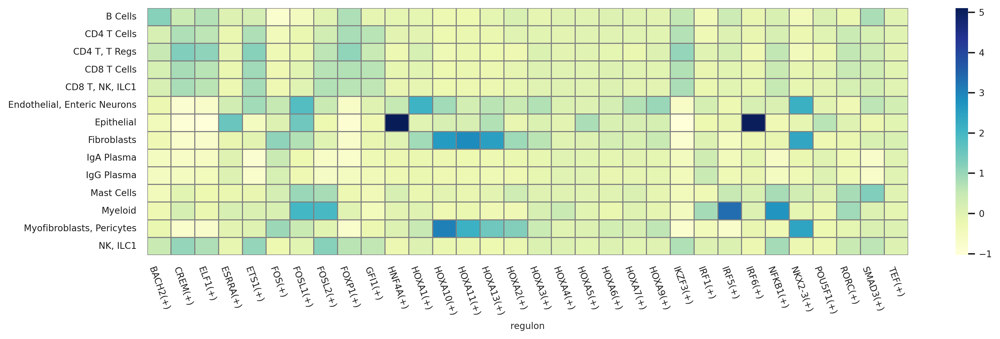

In [64]:
fig, ax1 = plt.subplots(1, 1, figsize=(15, 4))
xticks = df_heatmap.columns
sns.axes_style({'font.family': ['sans-serif'],
                'font.sans-serif': ['Arial']
                })
sns.heatmap(df_heatmap, ax=ax1, annot=False, linecolor='gray', linewidth=.5,
            cmap="YlGnBu", annot_kws={"size": 6}, xticklabels=xticks)
plt.xticks(rotation=290) 
ax1.set_ylabel('')

fig.savefig('./figures/PerianalCD_IBD_regulons_z-score_heatmap.svg', format='svg')

In [31]:
df_loci = pd.read_csv('results/AP1_list.csv')
loci = df_loci[df_loci['TF'].notna()]['TF']
symbol = '(+)'
myloci = [x + symbol for x in loci] # match the regulon names, appending (+) to bin matrix

In [32]:
df_ap1 = df_results.loc[df_results.regulon.isin(myloci)]

In [33]:
bin_df = bin_mtx[bin_mtx.regulon.isin(myloci)] # locate the overlapps
merged_df = pd.merge(df_ap1, bin_df, on=['cell_type', 'regulon'], how='left') 
#merged_df = merged_df.drop('Unnamed: 0', axis=1) # clean up
merged_df = merged_df.loc[merged_df.presence > 0.2]
merged_df.to_csv('results/PerianalCD_AP1_regulons_z-score_presence.csv', index = False) # write output

In [61]:
df_heatmap = pd.pivot_table(data=df_ap1.sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
df_heatmap

regulon,ATF3(+),ATF4(+),ATF5(+),FOS(+),FOSB(+),FOSL1(+),FOSL2(+),JDP2(+),JUN(+),JUNB(+),JUND(+),MAF(+),MAFA(+),MAFB(+),MAFF(+),MAFG(+),MAFK(+)
cell_type,,,,,,,,,,,,,,,,,
B Cells,-0.710299,-0.656630,-0.603852,-0.815101,-0.585124,-0.515058,0.009456,-0.004263,-0.710171,-0.346563,-0.359985,-0.040728,-0.084847,-0.092064,-0.211347,-0.200128,-0.120562
CD4 T Cells,-0.503929,-0.648615,-0.562591,-0.445355,-0.516827,-0.186951,0.299515,0.020279,-0.604888,-0.111817,-0.252528,1.036779,-0.051579,-0.137920,-0.211800,-0.182230,-0.044485
"CD4 T, T Regs",-0.669446,-0.413464,-0.300397,-0.345364,-0.281230,-0.176472,0.605230,-0.334342,-0.546936,0.056056,-0.156768,1.534617,-0.313740,0.141992,0.050234,0.056617,-0.278108
CD8 T Cells,-0.324901,-0.580858,-0.529265,-0.293532,-0.419332,-0.031825,0.689045,-0.076160,-0.485375,0.038732,-0.090817,0.873114,-0.054830,-0.009641,0.031446,-0.190106,0.003064
"CD8 T, NK, ILC1",-0.220842,-0.635072,-0.608345,-0.296309,-0.459136,-0.017800,0.727984,-0.078254,-0.568474,-0.139241,-0.237904,0.848774,0.029010,0.006995,0.095149,-0.155426,-0.016619
"Endothelial, Enteric Neurons",0.377018,-0.568903,-0.604652,0.506888,-0.495258,1.811447,0.435987,1.484321,-0.186805,0.263685,-0.527476,-0.010767,0.098224,0.643104,0.892655,0.377647,1.469803
Epithelial,0.933403,-0.344991,-0.419853,0.047930,-0.594614,1.472642,-0.261093,0.634880,0.027311,0.300561,0.038147,-0.770785,1.584798,0.101314,0.422949,-0.115654,1.677689
Fibroblasts,0.552277,-0.353335,-0.324666,1.112432,-0.193548,0.719905,-0.011946,0.117115,0.528783,0.558565,-0.107894,-0.191711,-0.059629,0.628842,0.664677,0.194490,0.946139
IgA Plasma,0.386655,1.010186,0.908896,0.447790,0.787572,-0.249556,-0.697279,-0.097295,0.785010,0.086488,0.443650,-0.734353,0.015698,-0.462948,-0.377951,-0.054924,-0.355388


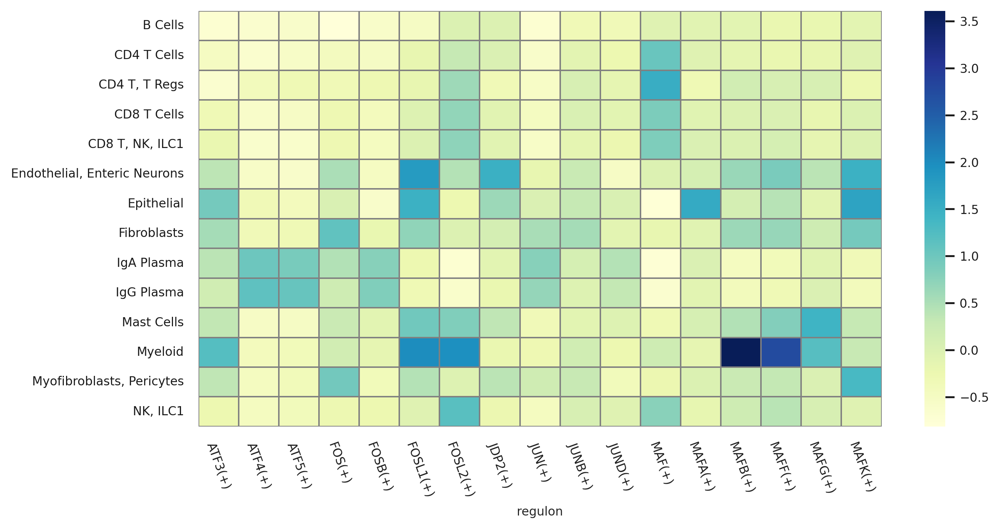

In [62]:
fig, ax1 = plt.subplots(1, 1, figsize=(10, 5))
xticks = df_heatmap.columns
sns.axes_style({'font.family': ['sans-serif'],
                'font.sans-serif': ['Arial']
                })
sns.heatmap(df_heatmap, ax=ax1, annot=False, linecolor='gray', linewidth=.5,
            cmap="YlGnBu", annot_kws={"size": 6}, xticklabels=xticks)
plt.xticks(rotation=290) 
ax1.set_ylabel('')

fig.savefig('./figures/PerianalCD_AP1_regulons_z-score_heatmap.svg', format='svg')

Subset with paired-matched Fistula vs. Tissue

In [19]:
meta_df = adata.obs

In [21]:
meta_df['sample_id'].value_counts()

Perianal11_Rect         8384
Perianal9_Sig           7765
Perianal3_Rect          7214
Perianal16_Rect         6937
Perianal4_TI            6807
Perianal6_Rect          6705
Perianal11_Fistula      6580
Perianal16_Fistula      6174
Perianal9_Rect          5972
Perianal7_Sig           5752
Perianal14_Rect         5544
Perianal2_Rect          5464
Perianal2_Sig           5303
Perianal7_Rect          4826
Perianal6_Sig           4611
Perianal13_Rect         4465
Perianal13_Sig          4428
Perianal10_Rect         4240
Perianal12_Sig          3710
Perianal3_Sig           3581
Perianal10_Sig          3501
Perianal8_Rect          3470
Perianal5_Rect          3413
Perianal8_Sig           3340
Perianal12_Rect         2851
Perianal14_Fistula      2826
Perianal4_Rect          2724
Perianal1_Sig           2490
Perianal5_Sig           1887
Perianal1_Transverse    1744
Name: sample_id, dtype: int64

In [34]:
tis_idx = adata.obs.loc[adata.obs.sample_id.isin(["Perianal11_Rect", 'Perianal14_Rect'])].index
fis_idx = adata.obs.loc[adata.obs.sample_id.isin(["Perianal11_Fistula", 'Perianal14_Fistula', 'Perianal16_Fistula'])].index
sub_idx = adata.obs.loc[adata.obs.sample_id.isin(["Perianal11_Fistula", 'Perianal14_Fistula', "Perianal11_Rect", 'Perianal14_Rect'])].index

In [35]:
fis_adata = adata[fis_idx]

In [36]:
df_obs = fis_adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['cell_type']]
df_results = ((df_scores.groupby(by='cell_type').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 1.8)].sort_values('Z', ascending=False).head()

,cell_type,regulon,Z
4589,Mast Cells,TAL1(+),8.436751
4367,Mast Cells,GATA1(+),8.230002
4368,Mast Cells,GATA2(+),8.095238
4469,Mast Cells,MITF(+),6.604102
5358,"Myofibroblasts, Pericytes",NR1H4(+),5.655688


/tmp/ipykernel_49909/1481274415.py:5: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


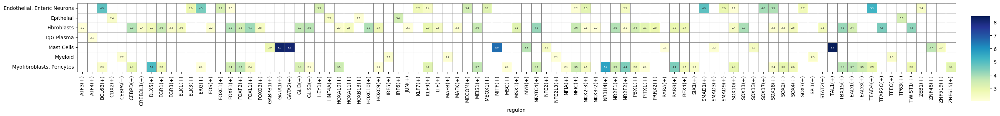

In [38]:
df_heatmap = pd.pivot_table(data=df_results[df_results.Z >= 1.9].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
#df_heatmap.drop(index='Myocyte', inplace=True) # We leave out Myocyte because many TFs are highly enriched (becuase of small number of cells).
fig, ax1 = plt.subplots(1, 1, figsize=(29, 12))
cbar_ax = fig.add_axes([1.01, .35, .02, 0.2])
sns.heatmap(df_heatmap, ax=ax1, annot=True, fmt=".1f", linewidths=.7, cbar=True, square=True, linecolor='gray', 
            cmap="YlGnBu", annot_kws={"size": 5}, cbar_ax=cbar_ax)
ax1.set_ylabel('')

savesvg('Fistula_sig_regulons_heatmap.svg', fig)

In [39]:
df_heatmap.to_csv('results/Fistula_sig_regulons_z-score.csv', index = False)

In [32]:
fib_adata = sub_adata[sub_adata.obs['cell_bin'] == 'Fibroblasts'].copy()

In [33]:
df_obs = fib_adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['site']]
df_results = ((df_scores.groupby(by='site').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 1)].sort_values('Z', ascending=False).head()

,site,regulon,Z
334,Fistula,TFAP2C(+),1.740240
345,Fistula,TWIST1(+),1.715285
295,Fistula,SOX11(+),1.653662
315,Fistula,STAT2(+),1.611953
314,Fistula,STAT1(+),1.447267


In [30]:
df_results.sort_values('Z', ascending=False).to_csv('./results/Fistula_vs_Tissue_regulons_z-scores.csv')

2962 fibroblasts cells matched

In [52]:
fibro_idx = sub_adata.obs.loc[sub_adata.obs['cell_type'] == 'Fibroblasts'].index

In [53]:
fibro_sub_adata = sub_adata[fibro_idx]

In [54]:
df_obs = fibro_sub_adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['site']]
df_results = ((df_scores.groupby(by='site').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 1.7)].sort_values('Z', ascending=False).head()

,site,regulon,Z


In [55]:
df_results.sort_values('Z', ascending=False).to_csv('./results/Fibroblats_Fistula_vs_Tissue_regulons_z-scores.csv')

CELL TYPE SPECIFIC REGULATORS - RSS

In [45]:
rss = regulon_specificity_scores(auc_mtx, adata.obs.cell_type)
rss.head()

,AR(+),ARNTL(+),ARX(+),ASCL1(+),ASCL2(+),ATF1(+),ATF3(+),ATF4(+),ATF7(+),ATOH1(+),...,ZNF74(+),ZNF740(+),ZNF766(+),ZNF777(+),ZNF786(+),ZNF836(+),ZNF846(+),ZNF879(+),ZSCAN18(+),ZSCAN9(+)
IgA Plasma,0.334694,0.263985,0.295294,0.321023,0.197928,0.397281,0.437066,0.503053,0.268350,0.363620,...,0.356002,0.311116,0.195568,0.271047,0.250854,0.241330,0.256242,0.340441,0.300880,0.287525
Epithelial,0.185247,0.174036,0.190916,0.176400,0.200389,0.184770,0.186024,0.180394,0.180130,0.212204,...,0.185861,0.178659,0.171840,0.187051,0.177508,0.178042,0.179242,0.179649,0.188358,0.179659
Proliferating B Cells,0.176769,0.174773,0.178618,0.177389,0.177795,0.177319,0.176315,0.174540,0.175119,0.179577,...,0.177264,0.175693,0.169717,0.177572,0.176235,0.173519,0.173212,0.176868,0.176978,0.175075
Myeloid,0.206433,0.187894,0.200399,0.204720,0.176039,0.207656,0.225614,0.205745,0.199939,0.202643,...,0.195054,0.190173,0.237474,0.191391,0.197030,0.193114,0.195767,0.197885,0.216401,0.192048
IgG Plasma,0.216049,0.210345,0.205886,0.222995,0.182298,0.229639,0.240696,0.261070,0.207315,0.228399,...,0.220029,0.217415,0.185879,0.204863,0.195760,0.200554,0.201991,0.225378,0.213822,0.213598


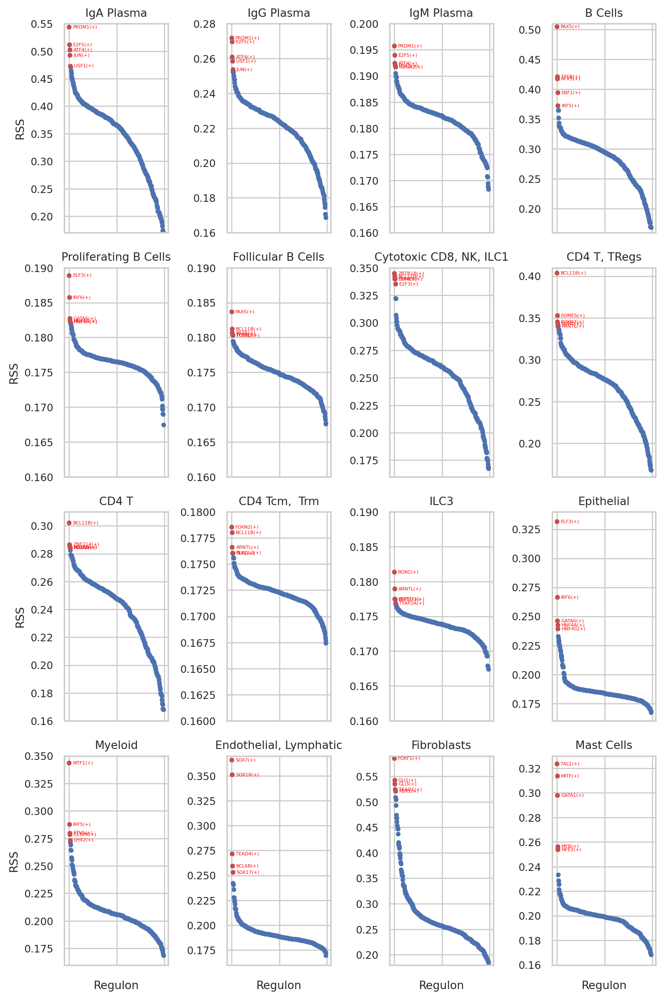

In [48]:
sns.set()
sns.set(style='whitegrid', font_scale=0.8)
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8), (ax9, ax10, ax11, ax12), (ax13, ax14, ax15, ax16)) = plt.subplots(4, 4, figsize=(8, 12), dpi=100)
plot_rss(rss, 'IgA Plasma', ax=ax1)
ax1.set_xlabel('')
plot_rss(rss, 'IgG Plasma', ax=ax2)
ax2.set_xlabel('')
ax2.set_ylabel('')
plot_rss(rss, 'IgM Plasma', ax=ax3)
ax3.set_xlabel('')
ax3.set_ylabel('')
plot_rss(rss, 'B Cells', ax=ax4)
ax4.set_xlabel('')
ax4.set_ylabel('')
plot_rss(rss, 'Proliferating B Cells', ax=ax5)
ax5.set_xlabel('')
plot_rss(rss, 'Follicular B Cells', ax=ax6)
ax6.set_ylabel('')
ax6.set_xlabel('')
plot_rss(rss, 'Cytotoxic CD8, NK, ILC1', ax=ax7)
ax7.set_ylabel('')
ax7.set_xlabel('')
plot_rss(rss, 'CD4 T, TRegs', ax=ax8)
ax8.set_ylabel('')
ax8.set_xlabel('')
plot_rss(rss, 'CD4 T', ax=ax9)
ax9.set_xlabel('')
plot_rss(rss, 'CD4 Tcm,  Trm', ax=ax10)
ax10.set_ylabel('')
ax10.set_xlabel('')
plot_rss(rss, 'ILC3', ax=ax11)
ax11.set_ylabel('')
ax11.set_xlabel('')
plot_rss(rss, 'Epithelial', ax=ax12)
ax12.set_ylabel('')
ax12.set_xlabel('')
plot_rss(rss, 'Myeloid', ax=ax13)
plot_rss(rss, 'Endothelial, Lymphatic', ax=ax14)
ax14.set_ylabel('')
plot_rss(rss, 'Fibroblasts', ax=ax15)
ax15.set_ylabel('')
plot_rss(rss, 'Mast Cells', ax=ax16)
ax16.set_ylabel('')
plt.tight_layout()
savesvg('PerianalCD_rss.svg', fig)

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


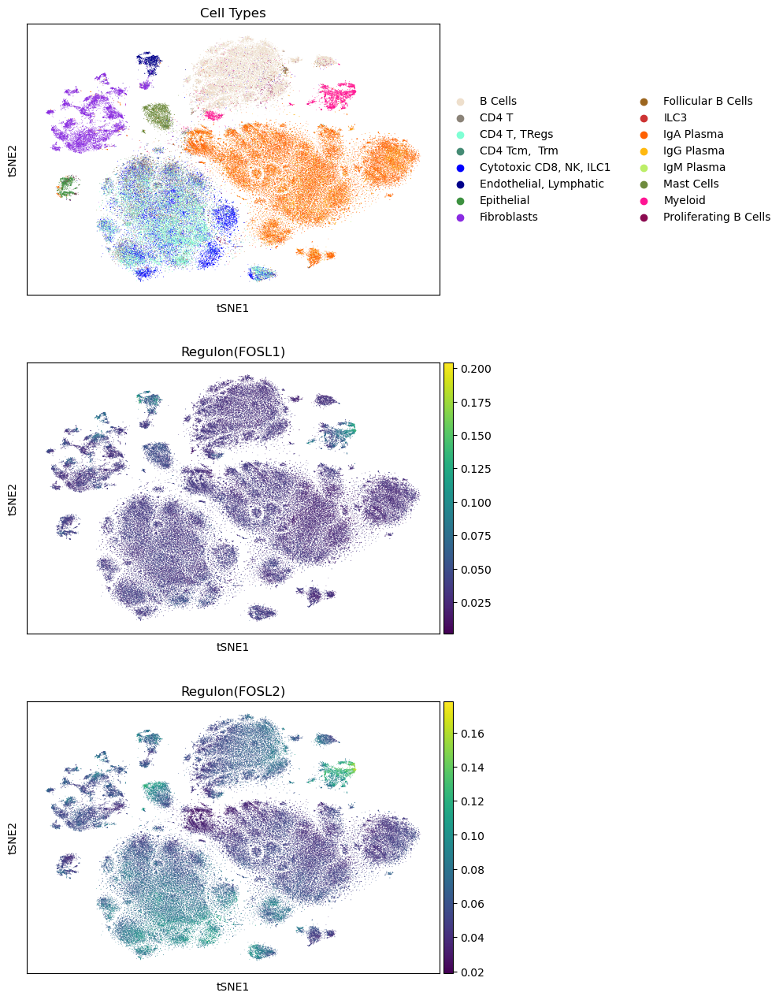

In [48]:
sc.pl.tsne(adata, color=['cell_type', 'Regulon(FOSL1(+))', 'Regulon(FOSL2(+))'],
           title=['Cell Types', 'Regulon(FOSL1)', 'Regulon(FOSL2)'], ncols=1, use_raw=False,
          save='PerianalCD_FOS_regulons.svg', palette=COLORS, cmap='viridis')

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


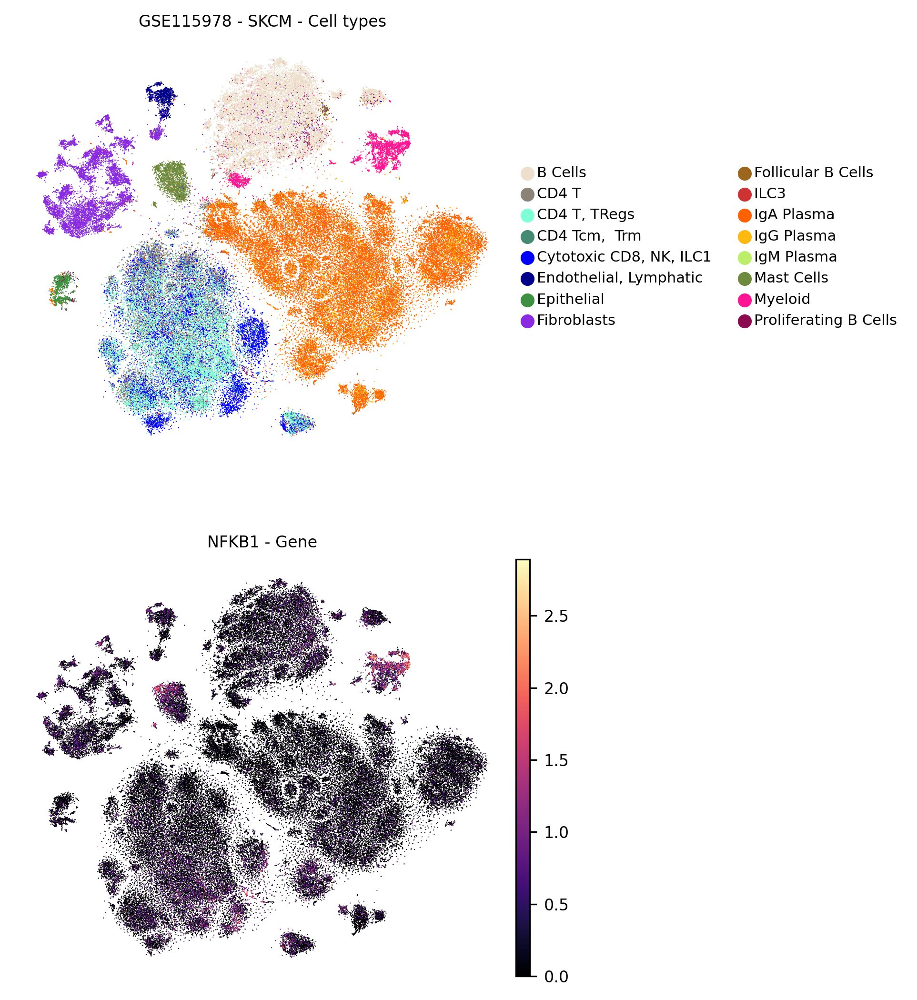

In [52]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'NFKB1'], 
           title=['GSE115978 - SKCM - Cell types', 'NFKB1 - Gene'], ncols=1, palette=COLORS, use_raw=False,
           cmap='magma')